In [1]:
import tensorflow as tf
import matplotlib.image as img
%matplotlib inline
import numpy as np
from collections import defaultdict
import collections
from shutil import copy
from shutil import copytree, rmtree
from tensorflow import keras
import keras.backend as K
from keras.models import load_model
from keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import tensorflow as tf
import keras.backend as K
from keras import regularizers
from keras.applications.inception_v3 import InceptionV3
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, CSVLogger
from keras.optimizers import SGD
from keras.regularizers import l2
from tensorflow import keras
from keras import models
import cv2
import warnings
warnings.filterwarnings('ignore')
from PIL import Image

In [2]:
print(tf.__version__)
print(tf.test.gpu_device_name())

2.17.0



In [4]:
def get_data_extract():
    if "food-101" in os.listdir():
    print("Dataset already exists")
    else:
        print("Downloading the data...")
        !wget http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
            print("Dataset downloaded!")
            print("Extracting data..")
            !tar xzvf food-101.tar.gz
            print("Extraction done!")

In [5]:
get_data_extract()

Dataset already exists


In [2]:
directory_path = "E:\\Documents\\college\\food-101\\food-101\\food-101"

contents = os.listdir(directory_path)

# Print the contents
for item in contents:
    print(item)

.DS_Store
images
license_agreement.txt
meta
README.txt


In [3]:
os.listdir('E:\\Documents\\college\\food-101\\food-101\\food-101\\images')

['.DS_Store',
 'apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheesecake',
 'cheese_plate',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisq

In [4]:
os.listdir('E:\\Documents\\college\\food-101\\food-101\\food-101\\meta')

['classes.txt',
 'labels.txt',
 'test.json',
 'test.txt',
 'train.json',
 'train.txt']

In [5]:
file_path = r'E:\\Documents\\college\\food-101\\food-101\\food-101\\meta\\train.txt'

with open(file_path, 'r') as file:
    contents = file.readlines()

for line in contents:
    print(line.strip())

apple_pie/1005649
apple_pie/1014775
apple_pie/1026328
apple_pie/1028787
apple_pie/1043283
apple_pie/1050519
apple_pie/1057749
apple_pie/1057810
apple_pie/1072416
apple_pie/1074856
apple_pie/1074942
apple_pie/1076891
apple_pie/1077610
apple_pie/1077964
apple_pie/1088809
apple_pie/1097378
apple_pie/1103795
apple_pie/1109597
apple_pie/1111062
apple_pie/1112300
apple_pie/1112838
apple_pie/1121884
apple_pie/112378
apple_pie/1133267
apple_pie/1142597
apple_pie/1147371
apple_pie/1154371
apple_pie/1158360
apple_pie/1159801
apple_pie/1165004
apple_pie/1166116
apple_pie/1166210
apple_pie/116697
apple_pie/1174241
apple_pie/1174949
apple_pie/1177254
apple_pie/118237
apple_pie/1184568
apple_pie/1185445
apple_pie/1185654
apple_pie/1191665
apple_pie/1196628
apple_pie/1199851
apple_pie/1200079
apple_pie/1214326
apple_pie/1215650
apple_pie/1218767
apple_pie/1220194
apple_pie/1230465
apple_pie/1232311
apple_pie/123782
apple_pie/1239205
apple_pie/1240585
apple_pie/1246460
apple_pie/1246552
apple_pie/1252

pizza/2951831
pizza/2952219
pizza/2959665
pizza/2965
pizza/2967846
pizza/2980131
pizza/2989328
pizza/2990023
pizza/2990186
pizza/2992084
pizza/299535
pizza/2995731
pizza/2999507
pizza/3000535
pizza/300869
pizza/3018077
pizza/3020376
pizza/3023774
pizza/302591
pizza/3039549
pizza/3042454
pizza/3055697
pizza/3057192
pizza/3063955
pizza/3066951
pizza/307677
pizza/3082068
pizza/3082443
pizza/3084957
pizza/3102271
pizza/3105724
pizza/3109486
pizza/312479
pizza/3128495
pizza/3148119
pizza/3164761
pizza/3168266
pizza/3170114
pizza/3173779
pizza/317861
pizza/3185774
pizza/3191035
pizza/3193599
pizza/3196721
pizza/32004
pizza/320570
pizza/3207504
pizza/3214153
pizza/3256974
pizza/3264148
pizza/32666
pizza/326809
pizza/3269634
pizza/327415
pizza/3281494
pizza/329302
pizza/3297714
pizza/3312584
pizza/3314176
pizza/3314535
pizza/332231
pizza/3324050
pizza/3326344
pizza/3333459
pizza/3337370
pizza/3338774
pizza/333985
pizza/3342039
pizza/3366256
pizza/3367113
pizza/337272
pizza/3376519
pizza/337903

In [6]:
file_path = r'E:\\Documents\\college\\food-101\\food-101\\food-101\\meta\\classes.txt'

with open(file_path, 'r') as file:
    contents = file.readlines()

for line in contents:
    print(line.strip())

apple_pie
baby_back_ribs
baklava
beef_carpaccio
beef_tartare
beet_salad
beignets
bibimbap
bread_pudding
breakfast_burrito
bruschetta
caesar_salad
cannoli
caprese_salad
carrot_cake
ceviche
cheesecake
cheese_plate
chicken_curry
chicken_quesadilla
chicken_wings
chocolate_cake
chocolate_mousse
churros
clam_chowder
club_sandwich
crab_cakes
creme_brulee
croque_madame
cup_cakes
deviled_eggs
donuts
dumplings
edamame
eggs_benedict
escargots
falafel
filet_mignon
fish_and_chips
foie_gras
french_fries
french_onion_soup
french_toast
fried_calamari
fried_rice
frozen_yogurt
garlic_bread
gnocchi
greek_salad
grilled_cheese_sandwich
grilled_salmon
guacamole
gyoza
hamburger
hot_and_sour_soup
hot_dog
huevos_rancheros
hummus
ice_cream
lasagna
lobster_bisque
lobster_roll_sandwich
macaroni_and_cheese
macarons
miso_soup
mussels
nachos
omelette
onion_rings
oysters
pad_thai
paella
pancakes
panna_cotta
peking_duck
pho
pizza
pork_chop
poutine
prime_rib
pulled_pork_sandwich
ramen
ravioli
red_velvet_cake
risotto
sa

In [5]:
classes_path = "E:\\Documents\\college\\food-101\\food-101\\food-101\\meta\\classes.txt"

In [6]:
with open(classes_path, 'r') as file:
    classes = file.read().splitlines()

In [7]:
print(classes)

['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheesecake', 'cheese_plate', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macarons', 'miso_sou

In [8]:
num_classes = len(classes)
num_classes

101

In [9]:
dataset_path = "E:\\Documents\\college\\food-101\\food-101\\food-101\\images"

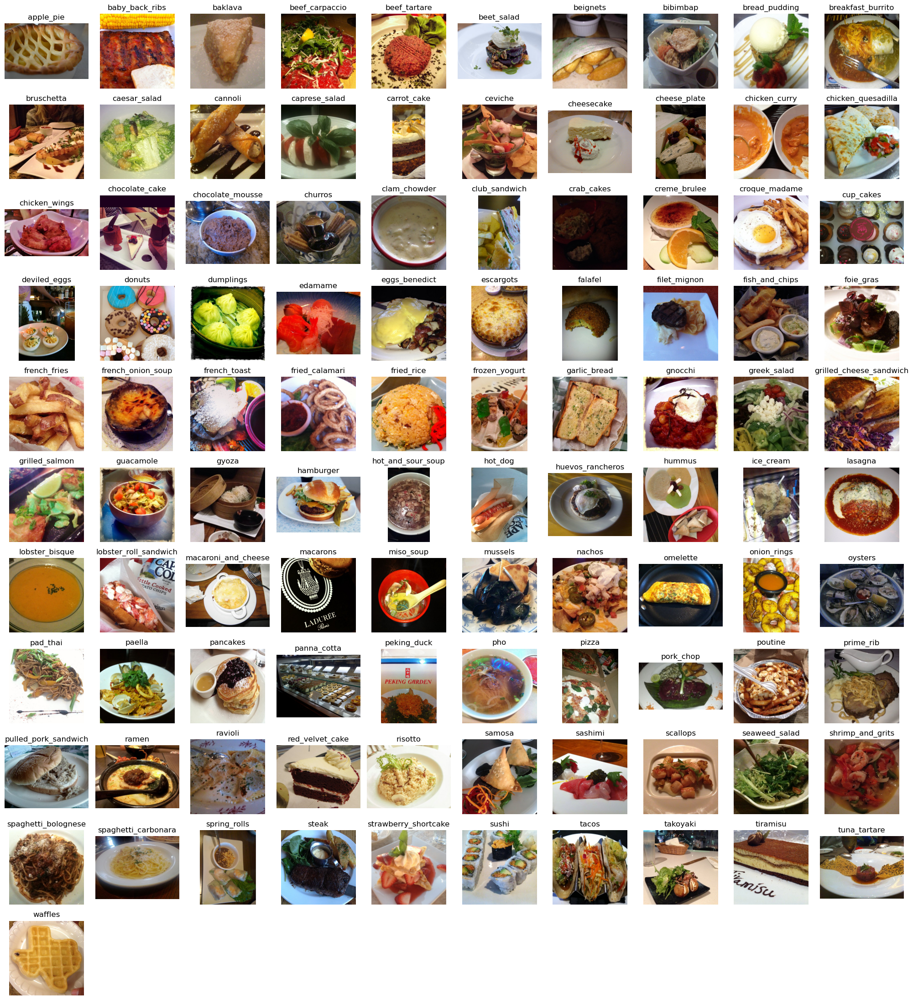

In [18]:
from PIL import Image
cols = 10
rows = (num_classes // cols) + (1 if num_classes % cols != 0 else 0)

plt.figure(figsize=(cols * 2, rows * 2))  

for idx, class_name in enumerate(classes):
    class_dir = os.path.join(dataset_path, class_name)
    image_files = os.listdir(class_dir)
    
    if image_files:
        random_image_file = random.choice(image_files)
        image_path = os.path.join(class_dir, random_image_file)
        image = Image.open(image_path)

        ax = plt.subplot(rows, cols, idx + 1)
        ax.imshow(image)
        ax.set_title(class_name)
        ax.axis("off")

plt.tight_layout()
plt.show()

In [12]:
def prepare_data(filepath, src, dest):
    classes_images = defaultdict(list)
    
    with open(filepath, 'r') as txt:
        paths = [read.strip() for read in txt.readlines()]
        for p in paths:
            food = p.split('/')
            classes_images[food[0]].append(food[1] + '.jpg')
    
    for food in classes_images.keys():
        print("\nCopying images into", food)
        if not os.path.exists(os.path.join(dest, food)):
            os.makedirs(os.path.join(dest, food))
        for i in classes_images[food]:
            src_path = os.path.join(src, food, i)
            dest_path = os.path.join(dest, food, i)
            if os.path.exists(src_path):
                copy(src_path, dest_path)
            else:
                print(f"Image {src_path} not found!")

    print("Copying Done!")

train_dir = "E:\\Documents\\college\\food-101\\train"
test_dir = "E:\\Documents\\college\\food-101\\test"

prepare_data(train_txt_path, dataset_path, train_dir)
prepare_data(test_txt_path, dataset_path, test_dir)

In [10]:
print("Total number of samples in train folder")
directory_path =  p=]'
'"E:\\Documents\\college\\food-101\\train"

count = 0

for root, dirs, files in os.walk(directory_path):
    count += len(dirs) + len(files)

print(count)

Total number of samples in train folder
75851


In [11]:
print("Total number of samples in test folder")
directory_path = "E:\\Documents\\college\\food-101\\test"

count = 0

for root, dirs, files in os.walk(directory_path):
    count += len(dirs) + len(files)

print(count)

Total number of samples in test folder
25351


In [12]:
os.chdir('/')

In [13]:
food_classes = [name for name in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, name))]

foods_sorted = sorted(food_classes)

foods_sorted


['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [11]:
def dataset_mini(food_list, src, dest):
    if os.path.exists(dest):
        rmtree(dest) 
        os.makedirs(dest)
        for food_item in food_list :
            print("Copying images into",food_item)
            copytree(os.path.join(src,food_item), os.path.join(dest,food_item))

In [12]:
food_list = ['apple_pie','pizza','omelette']
src_train = "E:\\Documents\\college\\food-101\\train"
dest_train = 'E:\\Documents\\college\\food-101\\mini_train'
src_test = "E:\\Documents\\college\\food-101\\test"
dest_test = "E:\\Documents\\college\\food-101\\mini_test"

In [31]:
print("Creating train data folder with new classes")
dataset_mini(food_list, src_train, dest_train)

Creating train data folder with new classes
Copying images into apple_pie
Copying images into pizza
Copying images into omelette


In [14]:
print("Total number of samples in train folder")

directory_path = "E:\\Documents\\college\\food-101\\mini_train"
count = 0

for root, dirs, files in os.walk(directory_path):
    
    count += len(dirs) + len(files)

print(count)


Total number of samples in train folder
2253


In [34]:
print("Creating test data folder with new classes")
dataset_mini(food_list, src_test, dest_test)

Creating test data folder with new classes
Copying images into apple_pie
Copying images into pizza
Copying images into omelette


In [15]:
print("Total number of samples in test folder")
directory_path = "E:\\Documents\\college\\food-101\\mini_test"
count = 0

for root, dirs, files in os.walk(directory_path):
   
    count += len(dirs) + len(files)

print(count)

Total number of samples in test folder
753


In [16]:
from keras.applications.resnet50 import ResNet50


K.clear_session()

n_classes = 3
img_width, img_height = 224, 224
train_data_dir = "E:\\Documents\\college\\food-101\\mini_train"
validation_data_dir = "E:\\Documents\\college\\food-101\\mini_test"
nb_train_samples = 2250
nb_validation_samples = 750
batch_size = 16

train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

resnet50 = ResNet50(weights='imagenet', include_top=False)
x = resnet50.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.2)(x)
predictions = Dense(n_classes, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs=resnet50.input, outputs=predictions)

model.compile(optimizer=SGD(learning_rate=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

log_dir = 'training_logs'
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

checkpointer = ModelCheckpoint(filepath=os.path.join(log_dir, 'best_model_3class.keras'), verbose=1, save_best_only=True)
csv_logger = CSVLogger(os.path.join(log_dir, 'history_3class.log'))

from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

history = model.fit(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size,
    epochs=30,
    verbose=1,
    callbacks=[csv_logger, checkpointer, early_stopping]
)

model.save(os.path.join(log_dir, 'my_model.keras'))



Found 2250 images belonging to 3 classes.
Found 750 images belonging to 3 classes.
Epoch 1/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.4096 - loss: 1.1958
Epoch 1: val_loss improved from inf to 2.76718, saving model to training_logs\best_model_3class.keras
140/140 ━━━━━━━━━━━━━━━━━━━━ 1226s 8s/step - accuracy: 0.4102 - loss: 1.1950 - val_accuracy: 0.3315 - val_loss: 2.7672
Epoch 2/30
  1/140 ━━━━━━━━━━━━━━━━━━━━ 16:29 7s/step - accuracy: 0.5625 - loss: 0.9929
Epoch 2: val_loss improved from 2.76718 to 2.44825, saving model to training_logs\best_model_3class.keras
140/140 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - accuracy: 0.5625 - loss: 0.9929 - val_accuracy: 0.4286 - val_loss: 2.4482
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6647 - loss: 0.8087
Epoch 3: val_loss did not improve from 2.44825
140/140 ━━━━━━━━━━━━━━━━━━━━ 835s 6s/step - accuracy: 0.6650 - loss: 0.8083 - val_accuracy: 0.3315 - val_loss: 3.8191
Epoch 4/30
  1/140 ━━━━━━━━━━━━━━━━━━━━ 11:40 5

In [17]:
class_map_3 = train_generator.class_indices
class_map_3

{'apple_pie': 0, 'omelette': 1, 'pizza': 2}

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


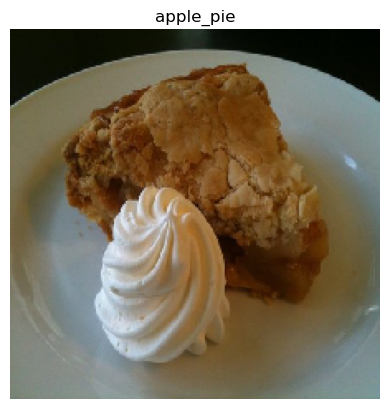

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


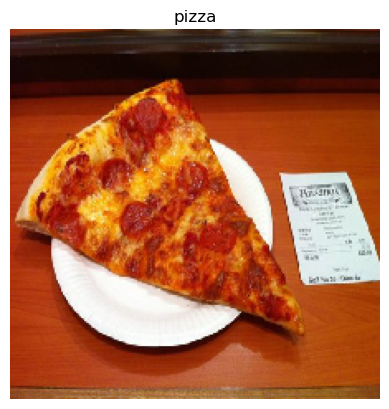

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


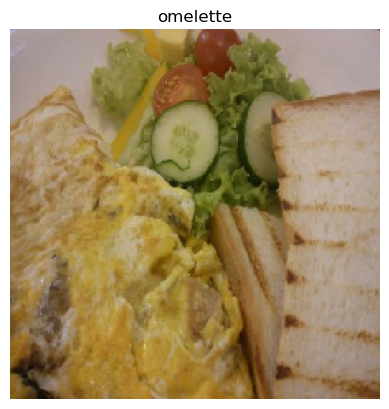

In [33]:
food_list = ['apple_pie','pizza','omelette']
def predict_class(model, images, show=True):
    for img_path in images:
        img = image.load_img(img_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        img /= 255.

        pred = model.predict(img)
        index = np.argmax(pred)
        food_list.sort()
        pred_value = food_list[index]
        if show:
            plt.imshow(img[0])
            plt.axis('off')
            plt.title(pred_value)
            plt.show()

images = [
    'E:\\Documents\\college\\food-101\\test\\apple_pie\\280007.jpg',
    'E:\\Documents\\college\\food-101\\test\\pizza\\415551.jpg',
    'E:\\Documents\\college\\food-101\\test\\omelette\\1019294.jpg'
]

predict_class(model, images, True)

In [20]:
loss, accuracy = model.evaluate(train_generator)
print(f'Mini test accuracy: {accuracy * 100:.2f}%')

141/141 ━━━━━━━━━━━━━━━━━━━━ 110s 780ms/step - accuracy: 0.9223 - loss: 0.2706
Mini test accuracy: 92.09%


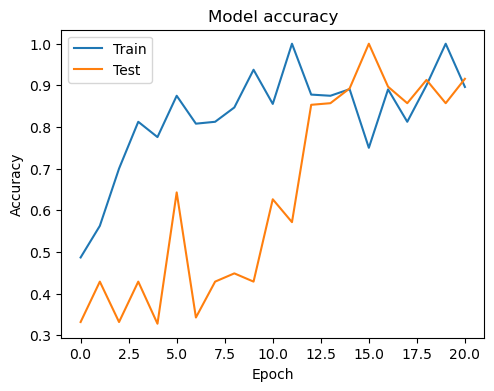

In [18]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

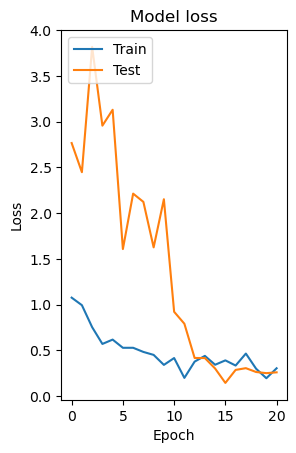

In [19]:
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [36]:
calorie_data = {
    'apple_pie': 300,
    'apple_crisp': 220,
    'baby_back_ribs': 290,
    'baklava': 220,
    'beef_carpaccio': 250,
    'beef_tartare': 200,
    'beet_salad': 150,
    'beignets': 300,
    'bibimbap': 350,
    'bread_pudding': 350,
    'breakfast_burrito': 400,
    'bruschetta': 150,
    'caesar_salad': 250,
    'cannoli': 300,
    'caprese_salad': 220,
    'carrot_cake': 350,
    'ceviche': 200,
    'cheesecake': 320,
    'cheese_plate': 300,
    'chicken_curry': 400,
    'chicken_quesadilla': 450,
    'chicken_wings': 400,
    'chocolate_cake': 400,
    'chocolate_mousse': 350,
    'churros': 400,
    'clam_chowder': 200,
    'club_sandwich': 500,
    'crab_cakes': 350,
    'creme_brulee': 300,
    'croque_madame': 500,
    'cup_cakes': 300,
    'deviled_eggs': 200,
    'donuts': 350,
    'dumplings': 250,
    'edamame': 100,
    'eggs_benedict': 400,
    'escargots': 250,
    'falafel': 350,
    'filet_mignon': 450,
    'fish_and_chips': 600,
    'foie_gras': 450,
    'french_fries': 300,
    'french_onion_soup': 200,
    'french_toast': 400,
    'fried_calamari': 350,
    'fried_rice': 350,
    'frozen_yogurt': 200,
    'garlic_bread': 250,
    'gnocchi': 300,
    'greek_salad': 200,
    'grilled_cheese_sandwich': 400,
    'grilled_salmon': 350,
    'guacamole': 250,
    'gyoza': 200,
    'hamburger': 500,
    'hot_and_sour_soup': 150,
    'hot_dog': 400,
    'huevos_rancheros': 350,
    'hummus': 200,
    'ice_cream': 300,
    'lasagna': 400,
    'lobster_bisque': 300,
    'lobster_roll_sandwich': 450,
    'macaroni_and_cheese': 400,
    'macarons': 150,
    'miso_soup': 100,
    'mussels': 200,
    'nachos': 400,
    'omelette': 150,
    'onion_rings': 300,
    'oysters': 200,
    'pad_thai': 400,
    'paella': 350,
    'pancakes': 350,
    'panna_cotta': 300,
    'peking_duck': 400,
    'pho': 350,
    'pizza': 300,
    'pork_chop': 400,
    'poutine': 600,
    'prime_rib': 500,
    'pulled_pork_sandwich': 600,
    'ramen': 350,
    'ravioli': 300,
    'red_velvet_cake': 400,
    'risotto': 350,
    'samosa': 250,
    'sashimi': 200,
    'scallops': 300,
    'seaweed_salad': 150,
    'shrimp_and_grits': 400,
    'spaghetti_bolognese': 350,
    'spaghetti_carbonara': 400,
    'spring_rolls': 200,
    'steak': 500,
    'strawberry_shortcake': 350,
    'sushi': 200,
    'tacos': 300,
    'takoyaki': 200,
    'tiramisu': 400,
    'tuna_tartare': 250,
    'waffles': 350
}

print(calorie_data)

{'apple_pie': 300, 'apple_crisp': 220, 'baby_back_ribs': 290, 'baklava': 220, 'beef_carpaccio': 250, 'beef_tartare': 200, 'beet_salad': 150, 'beignets': 300, 'bibimbap': 350, 'bread_pudding': 350, 'breakfast_burrito': 400, 'bruschetta': 150, 'caesar_salad': 250, 'cannoli': 300, 'caprese_salad': 220, 'carrot_cake': 350, 'ceviche': 200, 'cheesecake': 320, 'cheese_plate': 300, 'chicken_curry': 400, 'chicken_quesadilla': 450, 'chicken_wings': 400, 'chocolate_cake': 400, 'chocolate_mousse': 350, 'churros': 400, 'clam_chowder': 200, 'club_sandwich': 500, 'crab_cakes': 350, 'creme_brulee': 300, 'croque_madame': 500, 'cup_cakes': 300, 'deviled_eggs': 200, 'donuts': 350, 'dumplings': 250, 'edamame': 100, 'eggs_benedict': 400, 'escargots': 250, 'falafel': 350, 'filet_mignon': 450, 'fish_and_chips': 600, 'foie_gras': 450, 'french_fries': 300, 'french_onion_soup': 200, 'french_toast': 400, 'fried_calamari': 350, 'fried_rice': 350, 'frozen_yogurt': 200, 'garlic_bread': 250, 'gnocchi': 300, 'greek_s

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


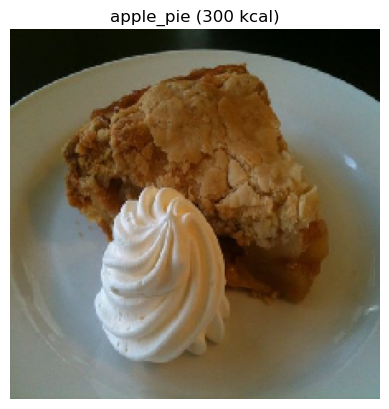

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


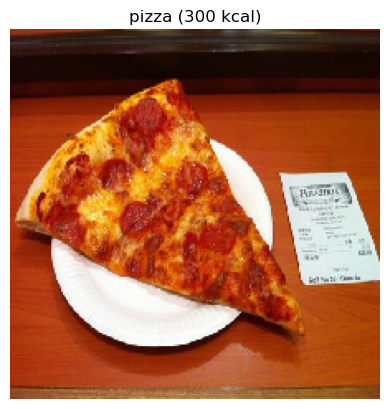

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


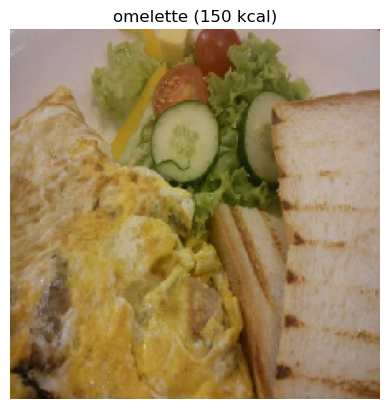

In [37]:
def predict_class(model, images, show=True):
    for img_path in images:
        img = image.load_img(img_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        img /= 255.

        pred = model.predict(img)
        index = np.argmax(pred)
        food_list.sort()
        pred_value = food_list[index]
        calories = calorie_data[pred_value]
        
        if show:
            plt.imshow(img[0])
            plt.axis('off')
            plt.title(f'{pred_value} ({calories} kcal)')
            plt.show()

images = [
    'E:\\Documents\\college\\food-101\\test\\apple_pie\\280007.jpg',
    'E:\\Documents\\college\\food-101\\test\\pizza\\415551.jpg',
    'E:\\Documents\\college\\food-101\\test\\omelette\\1019294.jpg'
]

predict_class(model, images, True)